# Neural Networks

## Review: Linear & Logistic Regressions

<img src="resources/nn_1.png" width = "400">

## Multi-layer Perceptron

- Also known as **feed-forward neutal networks**
- The boxes within the **hidden layer** are called **hidden units**
- Each hidden unit in the hidden layer ocmputes a nonlinear function (**activation function**) of the weighted sums of the input features
    - This results in the intermediate outputs v0, v1, v2
    - The MLP computed a weighted sum of these hidden unit outputs to form the final output value y hat.

<img src="resources/nn_2.png" width = "400">

- Every hidden layer enables the neural network to learn more complex relationships.
    - However, it requires more data and computation than a standard linear model

### With more than one layer
<img src="resources/nn_4.png" width = "400">


## Activation functions
- Scikit-learn uses the **ReLu activation** function by default.

<img src="resources/nn_3.png" width = "400">


## Pros and cons

<img src="resources/nn_5.png" width = "400">


## Key parameters
- **Solver** specifies the algorithm to use for learning the weights of the network
    - It is the algorithm that actually does the work of finding the optimal weights
    - Depending on the random initialization of the weights and the nature of the trajectory in the search path, the solver can end up at different local minima, which can have different validation scores.
    - **Adam** is the default solver and tends to be both efficient and effective on large data sets
    - For small data set, the **lbfgs** tends to be faster and find more effective weights

<img src="resources/nn_6.png" width = "400">


## Extras
- The number of weights (model coefficients) increases rapidly when we add hidden layers and hidden units
    - To control model complexity we can use regularization, like L1 or L2, as we did with Ridge and Lasso Regression.
- As when using other linear models,like Regression other SVMs, it can be critical to scale the data

## Datasets

In [4]:
import warnings

warnings.filterwarnings("ignore")

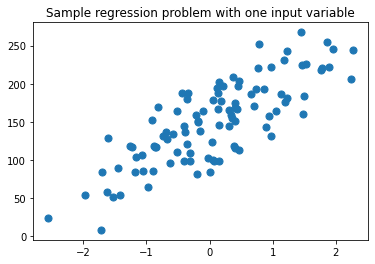

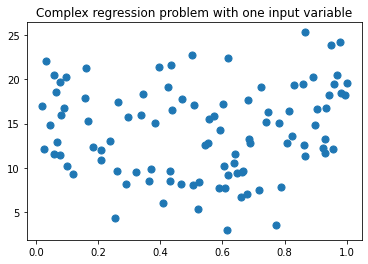

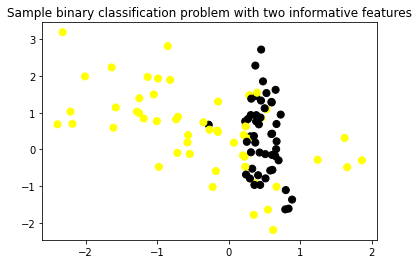

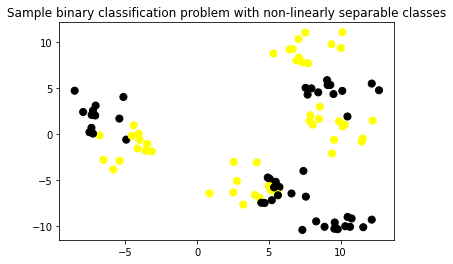

In [1]:
import numpy as np
import pandas as pd
import seaborn as sn
import matplotlib.pyplot as plt

from sklearn.model_selection import train_test_split
from sklearn.datasets import make_classification, make_blobs
from matplotlib.colors import ListedColormap
from sklearn.datasets import load_breast_cancer
from utils.adspy_shared_utilities import load_crime_dataset


cmap_bold = ListedColormap(['#FFFF00', '#00FF00', '#0000FF','#000000'])

# fruits dataset
fruits = pd.read_table('data/fruit_data_with_colors.txt')

feature_names_fruits = ['height', 'width', 'mass', 'color_score']
X_fruits = fruits[feature_names_fruits]
y_fruits = fruits['fruit_label']
target_names_fruits = ['apple', 'mandarin', 'orange', 'lemon']

X_fruits_2d = fruits[['height', 'width']]
y_fruits_2d = fruits['fruit_label']

# synthetic dataset for simple regression
from sklearn.datasets import make_regression
plt.figure()
plt.title('Sample regression problem with one input variable')
X_R1, y_R1 = make_regression(n_samples = 100, n_features=1,
                            n_informative=1, bias = 150.0,
                            noise = 30, random_state=0)
plt.scatter(X_R1, y_R1, marker= 'o', s=50)
plt.show()

# synthetic dataset for more complex regression
from sklearn.datasets import make_friedman1
plt.figure()
plt.title('Complex regression problem with one input variable')
X_F1, y_F1 = make_friedman1(n_samples = 100, n_features = 7,
                           random_state=0)

plt.scatter(X_F1[:, 2], y_F1, marker= 'o', s=50)
plt.show()

# synthetic dataset for classification (binary)
plt.figure()
plt.title('Sample binary classification problem with two informative features')
X_C2, y_C2 = make_classification(n_samples = 100, n_features=2,
                                n_redundant=0, n_informative=2,
                                n_clusters_per_class=1, flip_y = 0.1,
                                class_sep = 0.5, random_state=0)
plt.scatter(X_C2[:, 0], X_C2[:, 1], marker= 'o',
           c=y_C2, s=50, cmap=cmap_bold)
plt.show()

# more difficult synthetic dataset for classification (binary)
# with classes that are not linearly separable
X_D2, y_D2 = make_blobs(n_samples = 100, n_features = 2,
                       centers = 8, cluster_std = 1.3,
                       random_state = 4)
y_D2 = y_D2 % 2
plt.figure()
plt.title('Sample binary classification problem with non-linearly separable classes')
plt.scatter(X_D2[:,0], X_D2[:,1], c=y_D2,
           marker= 'o', s=50, cmap=cmap_bold)
plt.show()

# Breast cancer dataset for classification
cancer = load_breast_cancer()
(X_cancer, y_cancer) = load_breast_cancer(return_X_y = True)

# Communities and Crime dataset
(X_crime, y_crime) = load_crime_dataset("data/CommViolPredUnnormalizedData.txt")

## Neural Networks

### Activation functions

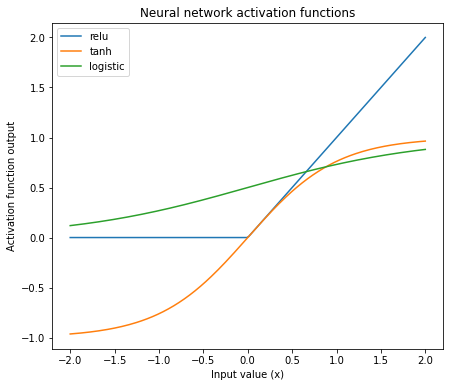

In [2]:
xrange = np.linspace(-2, 2, 200)

plt.figure(figsize=(7,6))

plt.plot(xrange, np.maximum(xrange, 0), label = 'relu')
plt.plot(xrange, np.tanh(xrange), label = 'tanh')
plt.plot(xrange, 1 / (1 + np.exp(-xrange)), label = 'logistic')
plt.legend()
plt.title('Neural network activation functions')
plt.xlabel('Input value (x)')
plt.ylabel('Activation function output')

plt.show()

## Classification

### Synthetic dataset 1: single hidden layer

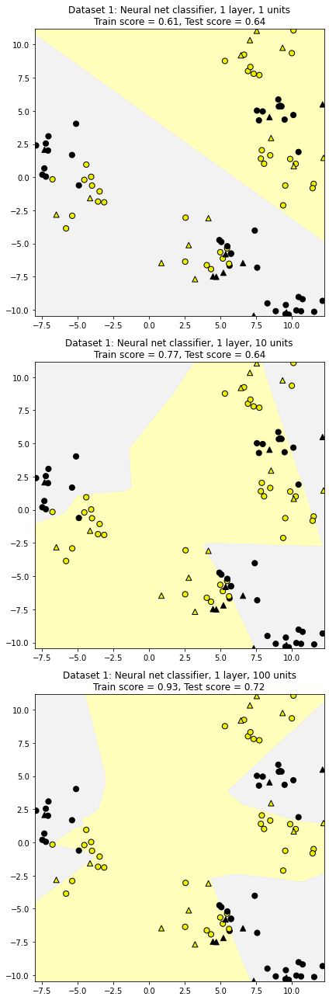

In [5]:
from sklearn.neural_network import MLPClassifier
from utils.adspy_shared_utilities import plot_class_regions_for_classifier_subplot

X_train, X_test, y_train, y_test = train_test_split(X_D2, y_D2, random_state=0)

fig, subaxes = plt.subplots(3, 1, figsize=(6,18))

# Units -> number of neurons/hidden units per hidden layer
# As we are only passing one list, it generates only one hidden layer with different amount of hidden units
for units, axis in zip([1, 10, 100], subaxes):
    nnclf = MLPClassifier(hidden_layer_sizes = [units], solver='lbfgs', random_state = 0).fit(X_train, y_train)
    # Solver specifies the algorithm to use for learning the weights of the network
    
    title = 'Dataset 1: Neural net classifier, 1 layer, {} units'.format(units)
    
    plot_class_regions_for_classifier_subplot(nnclf, X_train, y_train, X_test, y_test, title, axis)

    plt.tight_layout()

- With one single hidden unit, the model is mathematically equivalent to Logistic Regression.
- The more hidden units, the more complex relationships the model can learn. However, it is also more prone to overfitting the training data.

### Synthetic dataset 1: two hidden layers

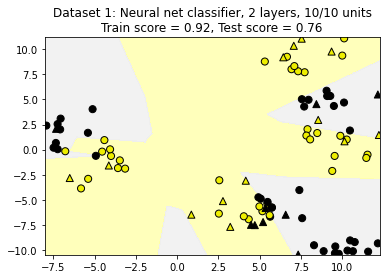

In [7]:
from utils.adspy_shared_utilities import plot_class_regions_for_classifier

X_train, X_test, y_train, y_test = train_test_split(X_D2, y_D2, random_state=0)

nnclf = MLPClassifier(hidden_layer_sizes = [10, 10], solver='lbfgs', random_state = 0).fit(X_train, y_train)

plot_class_regions_for_classifier(nnclf, X_train, y_train, X_test, y_test, 'Dataset 1: Neural net classifier, 2 layers, 10/10 units')

### Regularization parameter: alpha

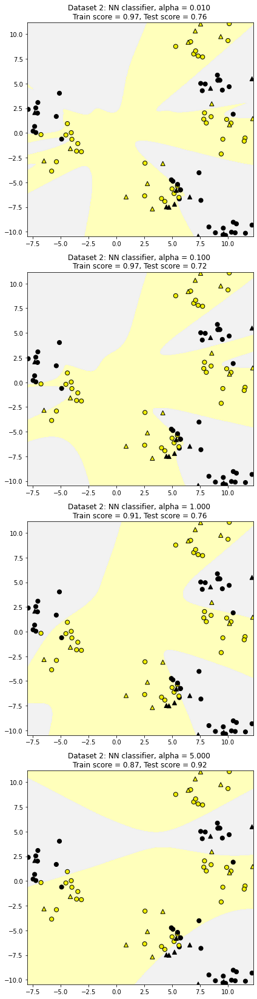

In [8]:
X_train, X_test, y_train, y_test = train_test_split(X_D2, y_D2, random_state=0)

fig, subaxes = plt.subplots(4, 1, figsize=(6, 23))

for this_alpha, axis in zip([0.01, 0.1, 1.0, 5.0], subaxes):
    nnclf = MLPClassifier(solver='lbfgs', activation = 'tanh',
                         alpha = this_alpha,
                         hidden_layer_sizes = [100, 100],
                         random_state = 0).fit(X_train, y_train)
    
    title = 'Dataset 2: NN classifier, alpha = {:.3f} '.format(this_alpha)
    
    plot_class_regions_for_classifier_subplot(nnclf, X_train, y_train, X_test, y_test, title, axis)
    plt.tight_layout()
    

- In this case, increasing alpha helps the model to generalize better.
    - Much smoother decision boundaries
    - Increased simplicity allows to generalize better

### The effect of different choices of activation function

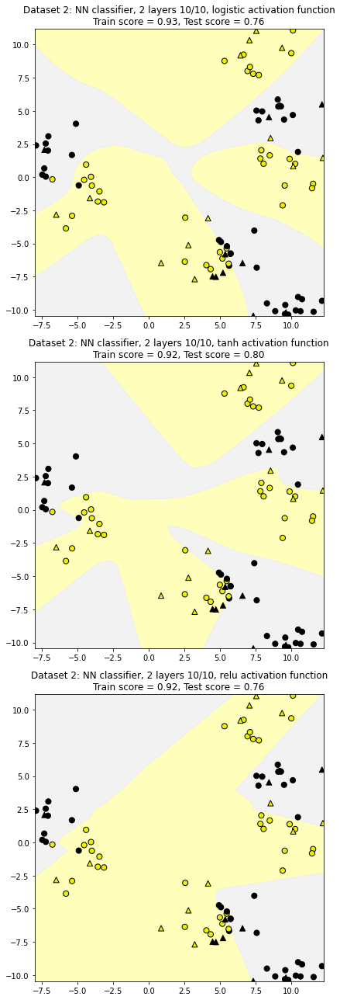

In [10]:
X_train, X_test, y_train, y_test = train_test_split(X_D2, y_D2, random_state=0)

fig, subaxes = plt.subplots(3, 1, figsize=(6,18))

for this_activation, axis in zip(['logistic', 'tanh', 'relu'], subaxes):
    nnclf = MLPClassifier(solver='lbfgs', activation = this_activation,
                         alpha = 0.1, hidden_layer_sizes = [10, 10],
                         random_state = 0).fit(X_train, y_train)
    
    title = 'Dataset 2: NN classifier, 2 layers 10/10, {} \
activation function'.format(this_activation)
    
    plot_class_regions_for_classifier_subplot(nnclf, X_train, y_train,
                                             X_test, y_test, title, axis)
    plt.tight_layout()

### Application to real-world dataset for classification

In [13]:
from sklearn.neural_network import MLPClassifier
from sklearn.preprocessing import MinMaxScaler


scaler = MinMaxScaler()

X_train, X_test, y_train, y_test = train_test_split(X_cancer, y_cancer, random_state = 0)
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

clf = MLPClassifier(hidden_layer_sizes = [100, 100], alpha = 5.0,
                   random_state = 0, solver='lbfgs').fit(X_train_scaled, y_train)

print('Breast cancer dataset')
print('Accuracy of NN classifier on training set: {:.2f}'
     .format(clf.score(X_train_scaled, y_train)))
print('Accuracy of NN classifier on test set: {:.2f}'
     .format(clf.score(X_test_scaled, y_test)))

Breast cancer dataset
Accuracy of NN classifier on training set: 0.98
Accuracy of NN classifier on test set: 0.97


## Regression

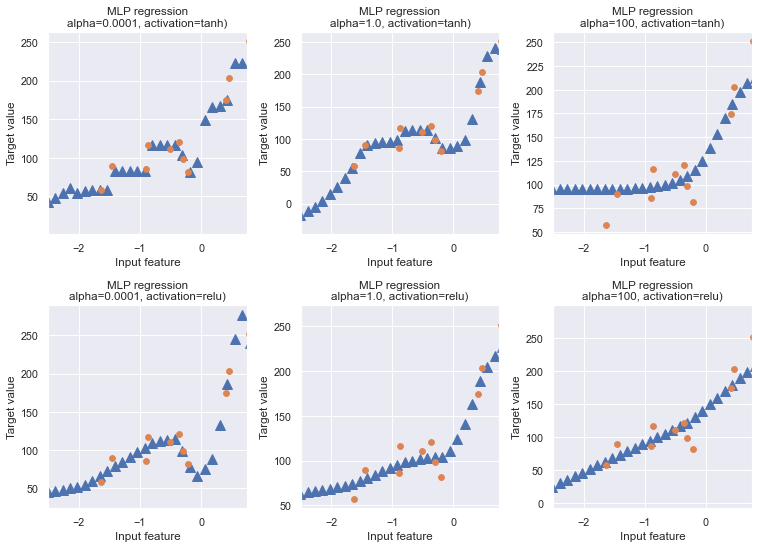

In [12]:
from sklearn.neural_network import MLPRegressor
import seaborn as sns

sns.set_theme()

fig, subaxes = plt.subplots(2, 3, figsize=(11,8), dpi=70)

X_predict_input = np.linspace(-3, 3, 50).reshape(-1,1)

X_train, X_test, y_train, y_test = train_test_split(X_R1[0::5], y_R1[0::5], random_state = 0)

for thisaxisrow, thisactivation in zip(subaxes, ['tanh', 'relu']):
    for thisalpha, thisaxis in zip([0.0001, 1.0, 100], thisaxisrow):
        mlpreg = MLPRegressor(hidden_layer_sizes = [100,100],
                             activation = thisactivation,
                             alpha = thisalpha,
                             solver = 'lbfgs').fit(X_train, y_train)
        y_predict_output = mlpreg.predict(X_predict_input)
        thisaxis.set_xlim([-2.5, 0.75])
        thisaxis.plot(X_predict_input, y_predict_output,
                     '^', markersize = 10)
        thisaxis.plot(X_train, y_train, 'o')
        thisaxis.set_xlabel('Input feature')
        thisaxis.set_ylabel('Target value')
        thisaxis.set_title('MLP regression\nalpha={}, activation={})'
                          .format(thisalpha, thisactivation))
        plt.tight_layout()

- As with classification, the effect of increasing the amount of L2regularization, by increasing alpha is to constrain the regression to use simpler models, with fewer and smaller weights
- Models on the right have less variance than models on the left

# Deep Learnin - optional

## Intro
- One of the key challenges in machine learning is finding the right features to use as input to a learning model for a particular problem -> **feature enfineering**
- There been a lot of research on what's called feature learning or feature extraction algorithms that can find food features automatically

## More on deep learning
- One of the advantages of deep learning is that it includes a sophisticated automatic featured learning phase as part of its supervised learning.
- The feature extraction phase uses a hierarchy of multiple feature extraction layers
- Starting from primitive, low-level features, in the initial layer each feature layer's output provides the input features to the next higher feature layer
- All features are used in the final supervised learning model

<img src="resources/deep_learning_example.png" width = "400">


## Pros and cons

<img src="resources/deep_learning_pros_cons.png" width = "400">


## Extras
- Subsampling = pooling